## MSTICPy and Notebooks in InfoSec

---

<h1 style="border: solid; padding:5pt; color:black; background-color:#909090">Session 7 - Visualization</h1>

---

## What this session covers:

- Event timelines
  - Basics
  - Grouping
  - Hover columns
  - Variants - timeline_values, timeline_duration
- Process Tree
- Graphs


## Prerequisites
- Python >= 3.8 Environment
- Jupyter installed
- MSTICPy installed
- Run az login

## Recommended
- VS Code


---

# <a style="border: solid; padding:5pt; color:black; background-color:#909090">Notebook Setup</a>

---

In [1]:
%env MSTICPYCONFIG=./msticpyconfig.yaml
import msticpy as mp
mp.init_notebook()

env: MSTICPYCONFIG=./msticpyconfig.yaml


---

# <a style="border: solid; padding:5pt; color:black; background-color:#909090">MSTICPy Timeline</a>

---

### - Use Bokeh plots (Python/Javascript visualization library)
### - Will work with any data that has a time stamp
### - Grouping by property
### - Hover/tooltips
### - Invoked from `pandas` accessor
#### [Reference: Timeline Documentation](https://msticpy.readthedocs.io/en/latest/visualization/EventTimeline.html)

## Note: Read data from an excel sheet

- You need to `pip install openpyxl`
- `df = pd.read_excel('/path/to/file.xlsx')`

#### You may need to play around with things like date formats since Excel
- Sometimes gives you dates as string
- Doesn't support timezone-aware dates

> We're going to use `procs_df = qry_local.WindowsSecurity.list_host_processes_mde()`

In [9]:
procs_df = pd.read_excel("./data/host_procs.xlsx")
procs_df.head()

,CreatedProcessIsElevated,CreatedProcessIntegrityLevel,CreatedProcessAccountSid,CreatedProcessAccountName,CreatedProcessAccountDomainName,CreatedProcessTokenElevationType,CreatedProcessFileMarkOfTheWeb,CreatedProcessCreationTime,CreatedProcessId,CreatedProcessName,CreatedProcessCommandLine,CreatedProcessFileType,CreatedProcessFileCreationTime,CreatedProcessFilePath,CreatedProcessFileSize,CreatedProcessFileMd5,CreatedProcessFileSha256,CreatedProcessFileSha1,InitiatingProcessImageMd5,InitiatingProcessImageSha256,InitiatingProcessImageSha1,InitiatingProcessAccountSid,InitiatingProcessAccountDomainName,InitiatingProcessAccountName,InitiatingProcessCreationTime,...,InitiatingProcessStartupFlags,CreatedProcessShowWindow,CreatedProcessStartupFlags,InitiatingProcessCurrentWorkingDirectory,InitiatingProcessPosixProcessGroupId,InitiatingProcessPosixSessionId,InitiatingProcessPosixEffectiveUser,InitiatingProcessPosixEffectiveGroup,InitiatingProcessPosixAttachedTerminal,InitiatingProcessSignatureStatus,InitiatingProcessSignerType,CreatedProcessSignatureStatus,CreatedProcessSignerType,InitiatingProcessVersionInfoCompanyName,InitiatingProcessVersionInfoProductName,InitiatingProcessVersionInfoProductVersion,InitiatingProcessVersionInfoInternalFileName,InitiatingProcessVersionInfoOriginalFileName,InitiatingProcessVersionInfoFileDescription,CreatedProcessVersionInfoCompanyName,CreatedProcessVersionInfoProductName,CreatedProcessVersionInfoProductVersion,CreatedProcessVersionInfoInternalFileName,CreatedProcessVersionInfoOriginalFileName,CreatedProcessVersionInfoFileDescription
0,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
qry_local = mp.QueryProvider("LocalData")
procs_df = qry_local.M365D.list_host_processes_mde()

In [8]:
procs_df.mp_plot.timeline(time_column="CreatedProcessCreationTime")

Loading BokehJS ...

Column(id='1632', ...)

## Navigating Bokeh plots

### Toolbar

![Bokeh toolbar](./media/bokeh_toolbar.png)

![Bokeh RangeTool](./media/Bokeh_rangecontrol.png)

In [55]:
help(procs_df.mp_plot.timeline)

Help on method timeline in module msticpy.vis.mp_pandas_plot:

timeline(**kwargs) -> bokeh.models.layouts.LayoutDOM method of msticpy.vis.mp_pandas_plot.MsticpyPlotAccessor instance
    Display a timeline of events.
    
    Parameters
    ----------
    time_column : str, optional
        Name of the timestamp column
        (the default is 'TimeGenerated')
    source_columns : list, optional
        List of default source columns to use in tooltips
        (the default is None)
    
    Other Parameters
    ----------------
    title : str, optional
        Title to display (the default is None)
    alert : SecurityAlert, optional
        Add a reference line/label using the alert time (the default is None)
    ref_event : Any, optional
        Add a reference line/label using the alert time (the default is None)
    ref_time : datetime, optional
        Add a reference line/label using `ref_time` (the default is None)
    group_by : str
        The column to group timelines on.
    

## Grouping timeline events



In [12]:
procs_df.mp_plot.timeline(
    time_column="CreatedProcessCreationTime",
    group_by="CreatedProcessAccountName",
    legend="none"
)

Loading BokehJS ...

Column(id='2441', ...)

## Adding hover (tooltip) columns

## <a style="border: solid; padding:5pt; color:black; background-color:#309030">Task 1 - Add tooltip columnsName</a>

Add some informative columns to the the hover/tooltip box

1. Choose the columns from the list of available columns
2. Use Python help(procs_df.mp_plot.timeline) to find the correct parameter name to specify the list of columns
3. Extend the previous plot to add the columns


<details>
<summary>Hints...</summary>
<ul>
<li>Use the cell below to identify columns in the source dataframe.</li>
<li>Use the <b>source_columns</b> to specify a list of columns.</li>
<li>Final command should look something like this
<pre>
procs_df.mp_plot.timeline(
    time_column="CreatedProcessCreationTime",
    group_by="CreatedProcessAccountName",
    legend="none",
    source_columns=["CreatedProcessName", "CreatedProcessCommandLine"]
)
</pre>
</li>
</ul>
</details>


In [ ]:
procs_df.filter(regex="CreatedProcess.*").columns

Index(['CreatedProcessIsElevated', 'CreatedProcessIntegrityLevel',
       'CreatedProcessAccountSid', 'CreatedProcessAccountName',
       'CreatedProcessAccountDomainName', 'CreatedProcessTokenElevationType',
       'CreatedProcessFileMarkOfTheWeb', 'CreatedProcessCreationTime',
       'CreatedProcessId', 'CreatedProcessName', 'CreatedProcessCommandLine',
       'CreatedProcessFileType', 'CreatedProcessFileCreationTime',
       'CreatedProcessFilePath', 'CreatedProcessFileSize',
       'CreatedProcessFileMd5', 'CreatedProcessFileSha256',
       'CreatedProcessFileSha1', 'CreatedProcessStartKey',
       'CreatedProcessReparentingProcessCreationTimeUtc',
       'CreatedProcessReparentingProcessId',
       'CreatedProcessParentCreationTimeUtc', 'CreatedProcessParentName',
       'CreatedProcessParentId', 'CreatedProcessAttributes',
       'CreatedProcessAccountUpn', 'CreatedProcessAccountAzureADId',
       'CreatedProcessShowWindow', 'CreatedProcessStartupFlags',
       'CreatedProcessSig

In [ ]:
procs_df.mp_plot.timeline(
    time_column="CreatedProcessCreationTime",
    group_by="CreatedProcessAccountName",
    legend="none",
    #...
)

In [13]:
procs_df.mp_plot.timeline(
    time_column="CreatedProcessCreationTime",
    group_by="CreatedProcessAccountName",
    legend="none",
    source_columns=[
        "CreatedProcessAccountName",
        "CreatedProcessCommandLine",
        "CreatedProcessParentName"
    ]
)

Loading BokehJS ...

Column(id='2914', ...)

---

# <a style="border: solid; padding:5pt; color:black; background-color:#909090">Timeline variants</a>

---

## Timeline duration

Highlight the start and end of activity

In [14]:
procs_df.mp_plot.timeline_duration(
    time_column="CreatedProcessCreationTime",
    group_by="CreatedProcessAccountName",
    source_columns=["CreatedProcessName", "CreatedProcessCommandLine"]
)

Loading BokehJS ...

Column(id='3305', ...)

## Timeline values - plot scalar values


In [15]:
help(procs_df.mp_plot.timeline_values)

Help on method timeline_values in module msticpy.vis.mp_pandas_plot:

timeline_values(value_column: str = None, **kwargs) -> bokeh.models.layouts.LayoutDOM method of msticpy.vis.mp_pandas_plot.MsticpyPlotAccessor instance
    Display a timeline of events.
    
    Parameters
    ----------
    time_column : str, optional
        Name of the timestamp column
        (the default is 'TimeGenerated')
    value_column : str
        The column name holding the value to plot vertically
    source_columns : list, optional
        List of default source columns to use in tooltips
        (the default is None)
    
    Other Parameters
    ----------------
    x : str, optional
        alias of `time_column`
    y : str, optional
        alias of `value_column`
    value_col : str, optional
        alias of `value_column`
    title : str, optional
        Title to display (the default is None)
    ref_event : Any, optional
        Add a reference line/label using the alert time (the default is 

### Breakdown of the following command


| `qry_local` | `.Network `    | `.list_azure_network_flows_by_ip()` | `.mp_plot`  | `.timeline_values(` |
|-------------|----------------|-------------------------------------|-------------|---------------------|
| provider    | query_category | query (returns DF)                  | pd accessor | plot function       |

In [16]:
qry_local.Network.list_azure_network_flows_by_ip().mp_plot.timeline_values(
    time_column="FlowStartTime",
    value_column="TotalAllowedFlows",
    group_by="L7Protocol",
    kind=["circle", "vbar"],
    source_columns=["AllExtIPs"]
)


Loading BokehJS ...

Column(id='3802', ...)

---

# <a style="border: solid; padding:5pt; color:black; background-color:#909090">Process Tree</a>

---

### [Reference: Process Tree](https://msticpy.readthedocs.io/en/latest/visualization/ProcessTree.html)

In [80]:
procs_df.mp_plot.process_tree()

Loading BokehJS ...

(Figure(id='15283', ...), Row(id='15391', ...))

## <a style="border: solid; padding:5pt; color:black; background-color:#309030">Task 2 - Process Tree</a>

Plot process tree with legend highlighting process name.

1. Extend the previous plot command to color by process name
2. Optionally, hide the legend box 

Use help(procs_df.mp_plot.process_tree) to see function help
<details>
<summary>Hints...</summary>
<ul>

<li>Use <b>legend_col={col_name}</b>parameter</li>
<li>Use <b>hide_legend=True</b>parameter</li>
<li>Command should look like this
<pre>
procs_df.mp_plot.process_tree(
    legend_col="CreatedProcessName",
    hide_legend=True
)
</pre>
</li>
</ul>
</details>


In [ ]:
procs_df.mp_plot.process_tree(
    # ...
)

In [17]:
procs_df.mp_plot.process_tree(
    legend_col="CreatedProcessName",
    hide_legend=True
)

Loading BokehJS ...

(Figure(id='4066', ...), Row(id='4185', ...))

## Mini appendix
### Process tree utilities to investigation parts of the tree

In [84]:
# build a process tree DF
proc_tree = procs_df.mp.build_process_tree()

In [93]:
from msticpy.transform.process_tree_utils import get_children, get_ancestors, get_siblings, get_roots, get_descendents

# return root processes
get_roots(proc_tree)

,CreatedProcessIsElevated,CreatedProcessIntegrityLevel,CreatedProcessAccountSid,CreatedProcessAccountName,CreatedProcessAccountDomainName,CreatedProcessTokenElevationType,CreatedProcessFileMarkOfTheWeb,CreatedProcessCreationTime,CreatedProcessId,CreatedProcessName,CreatedProcessCommandLine,CreatedProcessFileType,CreatedProcessFileCreationTime,CreatedProcessFilePath,CreatedProcessFileSize,CreatedProcessFileMd5,CreatedProcessFileSha256,CreatedProcessFileSha1,InitiatingProcessImageMd5,InitiatingProcessImageSha256,InitiatingProcessImageSha1,InitiatingProcessAccountSid,InitiatingProcessAccountDomainName,InitiatingProcessAccountName,InitiatingProcessCreationTime,...,InitiatingProcessSignatureStatus,InitiatingProcessSignerType,CreatedProcessSignatureStatus,CreatedProcessSignerType,InitiatingProcessVersionInfoCompanyName,InitiatingProcessVersionInfoProductName,InitiatingProcessVersionInfoProductVersion,InitiatingProcessVersionInfoInternalFileName,InitiatingProcessVersionInfoOriginalFileName,InitiatingProcessVersionInfoFileDescription,CreatedProcessVersionInfoCompanyName,CreatedProcessVersionInfoProductName,CreatedProcessVersionInfoProductVersion,CreatedProcessVersionInfoInternalFileName,CreatedProcessVersionInfoOriginalFileName,CreatedProcessVersionInfoFileDescription,src_index,InitiatingProcessFileName,parent_key,IsRoot,IsLeaf,IsBranch,source_index,path,parent_index
proc_key,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ntoskrnl.exe|4|2021-06-10 00:46:07.323060,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-10 00:46:07.323061100+00:00,4,ntoskrnl.exe,NaN,NaN,NaT,%system%\ntoskrnl.exe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1633,1633,NaN
wininit.exe|912|2021-06-10 00:46:10.511940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-10 00:46:10.511942500+00:00,912,wininit.exe,NaN,NaN,NaT,wininit.exe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1634,1634,NaN
smss.exe|10520|2021-06-21 11:15:35.370650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-21 11:15:35.370648800+00:00,10520,smss.exe,NaN,NaN,NaT,\Device\HarddiskVolume3\Windows\System32\smss.exe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1635,1635,NaN
outlook.exe|10576|2021-06-22 00:42:37.789900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-22 00:42:37.789896700+00:00,10576,OUTLOOK.EXE,NaN,NaN,NaT,OUTLOOK.EXE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1636,1636,NaN
userinit.exe|8572|2021-06-24 10:59:24.319380,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-24 10:59:24.319380+00:00,8572,userinit.exe,NaN,NaN,NaT,\Device\HarddiskVolume3\Windows\System32\userinit.exe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1637,1637,NaN
update.exe|12256|2021-06-24 10:59:43.272400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-24 10:59:43.272397500+00:00,12256,Update.exe,NaN,NaN,NaT,\Device\HarddiskVolume3\Users\UserPII_cb487ecb6ebb69c2e3f5369461ae31b54a1cdc01\AppData\Local\Mic...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1638,1638,NaN
userinit.exe|20356|2021-06-25 00:38:59.791720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-25 00:38:59.791718800+00:00,20356,userinit.exe,NaN,NaN,NaT,\Device\HarddiskVolume3\Windows\System32\userinit.exe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1639,1639,NaN
acrobat.exe|17944|2021-06-25 00:41:29.156720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-25 00:41:29.156715600+00:00,17944,Acrobat.exe,NaN,NaN,NaT,Acrobat.exe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,

In [88]:
get_children(proc_tree, source="outlook.exe|10576|2021-06-22 00:42:37.789900")

,CreatedProcessIsElevated,CreatedProcessIntegrityLevel,CreatedProcessAccountSid,CreatedProcessAccountName,CreatedProcessAccountDomainName,CreatedProcessTokenElevationType,CreatedProcessFileMarkOfTheWeb,CreatedProcessCreationTime,CreatedProcessId,CreatedProcessName,CreatedProcessCommandLine,CreatedProcessFileType,CreatedProcessFileCreationTime,CreatedProcessFilePath,CreatedProcessFileSize,CreatedProcessFileMd5,CreatedProcessFileSha256,CreatedProcessFileSha1,InitiatingProcessImageMd5,InitiatingProcessImageSha256,InitiatingProcessImageSha1,InitiatingProcessAccountSid,InitiatingProcessAccountDomainName,InitiatingProcessAccountName,InitiatingProcessCreationTime,...,InitiatingProcessSignatureStatus,InitiatingProcessSignerType,CreatedProcessSignatureStatus,CreatedProcessSignerType,InitiatingProcessVersionInfoCompanyName,InitiatingProcessVersionInfoProductName,InitiatingProcessVersionInfoProductVersion,InitiatingProcessVersionInfoInternalFileName,InitiatingProcessVersionInfoOriginalFileName,InitiatingProcessVersionInfoFileDescription,CreatedProcessVersionInfoCompanyName,CreatedProcessVersionInfoProductName,CreatedProcessVersionInfoProductVersion,CreatedProcessVersionInfoInternalFileName,CreatedProcessVersionInfoOriginalFileName,CreatedProcessVersionInfoFileDescription,src_index,InitiatingProcessFileName,parent_key,IsRoot,IsLeaf,IsBranch,source_index,path,parent_index
proc_key,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
outlook.exe|10576|2021-06-22 00:42:37.789900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-22 00:42:37.789896700+00:00,10576,OUTLOOK.EXE,NaN,NaN,NaT,OUTLOOK.EXE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1636,1636,NaN
acrobat.exe|1440|2021-06-22 01:27:18.538400,NaN,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,UserPII_cb487ecb6ebb69c2e3f5369461ae31b54a1cdc01,DomainPII_6c8dcea42fcdd51d2421333a881b2b98b372fa53,TokenElevationTypeLimited,NaN,2021-06-22 01:27:18.538402200+00:00,1440,Acrobat.exe,NaN,NaN,2021-05-28 05:58:58+00:00,C:\Program Files (x86)\Adobe\Acrobat DC\Acrobat\Acrobat.exe,3796704.0,ac7d72262c5389c8cbe58cdddd2083a3,9d84b01f481959d4c8c335af7c1473ba831b698387441a05713527f1dbb517d2,6daf3b0133be331cf2e41a8f4180f01653b91845,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,Invalid,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,Adobe Systems Incorporated,Adobe Acrobat DC,21.5.20048.436468,NaN,Acrobat.exe,Adobe Acrobat DC,NaN,NaN,outlook.exe|10576|2021-06-22 00:42:37.789900,False,False,True,1587,1636/1587,1636


In [94]:
get_descendents(proc_tree, source="outlook.exe|10576|2021-06-22 00:42:37.789900")

,CreatedProcessIsElevated,CreatedProcessIntegrityLevel,CreatedProcessAccountSid,CreatedProcessAccountName,CreatedProcessAccountDomainName,CreatedProcessTokenElevationType,CreatedProcessFileMarkOfTheWeb,CreatedProcessCreationTime,CreatedProcessId,CreatedProcessName,CreatedProcessCommandLine,CreatedProcessFileType,CreatedProcessFileCreationTime,CreatedProcessFilePath,CreatedProcessFileSize,CreatedProcessFileMd5,CreatedProcessFileSha256,CreatedProcessFileSha1,InitiatingProcessImageMd5,InitiatingProcessImageSha256,InitiatingProcessImageSha1,InitiatingProcessAccountSid,InitiatingProcessAccountDomainName,InitiatingProcessAccountName,InitiatingProcessCreationTime,...,InitiatingProcessSignatureStatus,InitiatingProcessSignerType,CreatedProcessSignatureStatus,CreatedProcessSignerType,InitiatingProcessVersionInfoCompanyName,InitiatingProcessVersionInfoProductName,InitiatingProcessVersionInfoProductVersion,InitiatingProcessVersionInfoInternalFileName,InitiatingProcessVersionInfoOriginalFileName,InitiatingProcessVersionInfoFileDescription,CreatedProcessVersionInfoCompanyName,CreatedProcessVersionInfoProductName,CreatedProcessVersionInfoProductVersion,CreatedProcessVersionInfoInternalFileName,CreatedProcessVersionInfoOriginalFileName,CreatedProcessVersionInfoFileDescription,src_index,InitiatingProcessFileName,parent_key,IsRoot,IsLeaf,IsBranch,source_index,path,parent_index
proc_key,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
outlook.exe|10576|2021-06-22 00:42:37.789900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-06-22 00:42:37.789896700+00:00,10576,OUTLOOK.EXE,NaN,NaN,NaT,OUTLOOK.EXE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,1636,1636,NaN
acrobat.exe|1440|2021-06-22 01:27:18.538400,NaN,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,UserPII_cb487ecb6ebb69c2e3f5369461ae31b54a1cdc01,DomainPII_6c8dcea42fcdd51d2421333a881b2b98b372fa53,TokenElevationTypeLimited,NaN,2021-06-22 01:27:18.538402200+00:00,1440,Acrobat.exe,NaN,NaN,2021-05-28 05:58:58+00:00,C:\Program Files (x86)\Adobe\Acrobat DC\Acrobat\Acrobat.exe,3796704.0,ac7d72262c5389c8cbe58cdddd2083a3,9d84b01f481959d4c8c335af7c1473ba831b698387441a05713527f1dbb517d2,6daf3b0133be331cf2e41a8f4180f01653b91845,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,NaN,NaN,Invalid,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,Adobe Systems Incorporated,Adobe Acrobat DC,21.5.20048.436468,NaN,Acrobat.exe,Adobe Acrobat DC,NaN,NaN,outlook.exe|10576|2021-06-22 00:42:37.789900,False,False,True,1587,1636/1587,1636
logtransport2.exe|12744|2021-06-22 11:17:29.430150,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,2021-06-22 11:17:29.430145400+00:00,12744,LogTransport2.exe,"""LogTransport2.exe"" 58F761C05F236BDC0A495FBA@AdobeID 1 0 NOVALUE NOVALUE",PortableExecutable,2021-05-28 05:58:58+00:00,C:\Program Files (x86)\Adobe\Acrobat DC\Acrobat\LogTransport2.exe,855264.0,5f478ee4a63932d1ed50a41c55a29e23,c7578c3d0f3a474bee2788cb8560fff57ddaecd1138b98e334ba92941c58a754,fdd8d08ae21a4edd569c31f098ad75aaacd783e2,ac7d72262c5389c8cbe58cdddd2083a3,9d84b01f481959d4c8c335af7c1473ba831b698387441a05713527f1dbb517d2,6daf3b0133be331cf2e41a8f4180f01653b91845,S-1-12-1-3476864874-1154527411-4288707492-1560701320,DomainPII_6c8dcea42fcdd51d2421333a881b2b98b372fa53,UserPII_cb487ecb6ebb69c2e3f5369461ae31b54a1cdc01,2021-06-22 01:27:18.538402200+00:00,...,Invalid,Unknown,Invalid,Unknown,Adobe Systems Incorporated,Adobe Acrobat DC,21.5.20048.436468,NaN,Acrobat.exe,Adobe Acrobat DC,Adobe Systems Incorporated,LogTransport Application,8.2.0.14,LogTransport2,LogTransport2.exe,LogTransport Application,1512.0,C:\Program Files (x86)\Adobe\Acrobat DC\Acrobat\Acrobat.exe,acrobat.exe|1440|2021-06-22 01:27:18.538400,False,False,True,1512,1636/1587/1512,1587
conhost.exe|17064|2021-06-22 11:17:29.461280,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTy

In [136]:
proc_tree[proc_tree.index.str.startswith("powershell.exe")].head()

,CreatedProcessIsElevated,CreatedProcessIntegrityLevel,CreatedProcessAccountSid,CreatedProcessAccountName,CreatedProcessAccountDomainName,CreatedProcessTokenElevationType,CreatedProcessFileMarkOfTheWeb,CreatedProcessCreationTime,CreatedProcessId,CreatedProcessName,CreatedProcessCommandLine,CreatedProcessFileType,CreatedProcessFileCreationTime,CreatedProcessFilePath,CreatedProcessFileSize,CreatedProcessFileMd5,CreatedProcessFileSha256,CreatedProcessFileSha1,InitiatingProcessImageMd5,InitiatingProcessImageSha256,InitiatingProcessImageSha1,InitiatingProcessAccountSid,InitiatingProcessAccountDomainName,InitiatingProcessAccountName,InitiatingProcessCreationTime,...,InitiatingProcessSignatureStatus,InitiatingProcessSignerType,CreatedProcessSignatureStatus,CreatedProcessSignerType,InitiatingProcessVersionInfoCompanyName,InitiatingProcessVersionInfoProductName,InitiatingProcessVersionInfoProductVersion,InitiatingProcessVersionInfoInternalFileName,InitiatingProcessVersionInfoOriginalFileName,InitiatingProcessVersionInfoFileDescription,CreatedProcessVersionInfoCompanyName,CreatedProcessVersionInfoProductName,CreatedProcessVersionInfoProductVersion,CreatedProcessVersionInfoInternalFileName,CreatedProcessVersionInfoOriginalFileName,CreatedProcessVersionInfoFileDescription,src_index,InitiatingProcessFileName,parent_key,IsRoot,IsLeaf,IsBranch,source_index,path,parent_index
proc_key,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
powershell.exe|9244|2021-06-24 00:59:43.689130,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,2021-06-24 00:59:43.689127700+00:00,9244,powershell.exe,"""powershell.exe"" -w Hidden -ep Bypass -file ""C:\Users\UserPII_645f5cd0404c4e1e192b246101c6588b1c...",PortableExecutable,2020-10-09 20:48:24.470101200+00:00,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,452608.0,04029e121a0cfa5991749937dd22a1d9,9f914d42706fe215501044acd85a32d58aaef1419d404fddfa5d3b48f66ccd9f,f43d9bb316e30ae1a3494ac5b0624f6bea1bf054,0639b0a6f69b3265c1e42227d650b7d1,ce9f70e104c07d92fc05fbd6000839fd6a87ff010e706396f87dd679244ed97b,545ec11dee642de633eb2c6f6ffc90cce4decf8d,S-1-12-1-3476864874-1154527411-4288707492-1560701320,DomainPII_6c8dcea42fcdd51d2421333a881b2b98b372fa53,UserPII_cb487ecb6ebb69c2e3f5369461ae31b54a1cdc01,2021-06-24 00:52:50.347644800+00:00,...,Valid,OsVendor,Valid,OsVendor,Microsoft Corporation,Microsoft ® Windows Script Host,5.812.10240.16384,wscript.exe,wscript.exe,Microsoft ® Windows Based Script Host,Microsoft Corporation,Microsoft® Windows® Operating System,10.0.19041.546,POWERSHELL,PowerShell.EXE,Windows PowerShell,125.0,C:\Windows\System32\wscript.exe,wscript.exe|2140|2021-06-24 00:52:50.347640,False,False,True,125,1633/1564/1138/1140/648/655/782/786/788/125,788
powershell.exe|18532|2021-06-23 03:12:10.599820,False,Medium,S-1-12-1-3476864874-1154527411-4288707492-1560701320,User_a1cdc01,Dom_372fa53,TokenElevationTypeLimited,NotWeb,2021-06-23 03:12:10.599816700+00:00,18532,powershell.exe,"""powershell.exe"" -w Hidden -ep Bypass -file ""C:\Users\UserPII_645f5cd0404c4e1e192b246101c6588b1c...",PortableExecutable,2020-10-09 20:48:24.470101200+00:00,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,452608.0,04029e121a0cfa5991749937dd22a1d9,9f914d42706fe215501044acd85a32d58aaef1419d404fddfa5d3b48f66ccd9f,f43d9bb316e30ae1a3494ac5b0624f6bea1bf054,0639b0a6f69b3265c1e42227d650b7d1,ce9f70e104c07d92fc05fbd6000839fd6a87ff010e706396f87dd679244ed97b,545ec11dee642de633eb2c6f6ffc90cce4decf8d,S-1-12-1-3476864874-1154527411-4288707492-1560701320,DomainPII_6c8dcea42fcdd51d2421333a881b2b98b372fa53,UserPII_cb487ecb6ebb69c2e3f5369461ae31b54a1cdc01,2021-06-23 03:08:20.325598500+00:00,...,Valid,OsVendor,Valid,OsVendor,Microsoft Corporation,Microsoft ® Windows Script Host,5.812.10240.16384,wscript.exe,wscript.exe,Microsoft ® Windows Based Script Host,Microsoft Corporation,Microsoft® Windows® Operating System,10.0.19041.546,POWERSHELL,PowerShell.EXE,Windows 

In [95]:
get_descendents(proc_tree, source="outlook.exe|10576|2021-06-22 00:42:37.789900").mp_plot.process_tree()

Loading BokehJS ...

(Figure(id='15965', ...), Row(id='16073', ...))

---

# <a style="border: solid; padding:5pt; color:black; background-color:#909090">Creating and plotting graphs</a>

---

### [Reference: Graphs/Networks](https://msticpy.readthedocs.io/en/latest/visualization/NetworkGraph.html)

In [97]:
help(procs_df.mp.to_graph)

Help on method to_graph in module msticpy.init.mp_pandas_accessors:

to_graph(**kwargs) method of msticpy.init.mp_pandas_accessors.MsticpyCoreAccessor instance
    Create a networkx graph from a DataFrame.
    
    Parameters
    ----------
    source_col : str
        Column for source nodes.
    target_col : str
        Column for target nodes.
    source_attrs : Optional[List[str]], optional
        Optional list of columns to use as source node attributes, by default None
    target_attrs : Optional[List[str]], optional
        Optional list of columns to use as target node attributes, by default None
    edge_attrs : Optional[List[str]], optional
        Optional list of columns to use as edge node attributes, by default None
    graph_type : str
        "graph" or "digraph" (for nx.DiGraph)
    
    Returns
    -------
    nx.Graph
        The networkx graph object



In [18]:
procs_df.mp_plot.network(
    source_col="CreatedProcessAccountName",
    target_col="CreatedProcessName"
)


Loading BokehJS ...

Figure(id='4295', ...)

## Adding node attributes

In [19]:
procs_df.mp_plot.network(
    source_col="CreatedProcessParentName",
    target_col="CreatedProcessName",
    target_attrs=["CreatedProcessAccountName"],
    # source_attrs=[...],
    # edge_attr=[...],
)

Loading BokehJS ...

Figure(id='4739', ...)

## <a style="border: solid; padding:5pt; color:black; background-color:#309030">Task 3 - Plot a graph of processes spawned by cmd.exe</a>

Filter the input DataFrame and replot.

1. Filter the input data frame to only child processes of "cmd.exe
2. Plot a graph
3. Add "CreatedProcessCommandLine", "CreatedProcessCreationTime" as source node attributes

<details>
<summary>Hints...</summary>
<ul>
<li>Use pandas filtering to get only processes whose parent is cmd.exe
<pre>
procs_df[procs_df["CreatedProcessParentName"].str.contains("cmd.exe")]
</pre>
</li>
<li>Plot the filtered result using the mp_plot.network accessor</li>
<li>Add "CreatedProcessCommandLine", "CreatedProcessCreationTime" to the "target_attrs" parameter list</li>
<li>Solution should look something like this
<pre>
procs_df[procs_df["CreatedProcessParentName"].str.contains("cmd.exe")].mp_plot.network(
    source_col="CreatedProcessParentName",
    target_col="CreatedProcessName",
    target_attrs=["CreatedProcessAccountName", "CreatedProcessCommandLine"]
)
</pre>
</ul>
</details>
 


In [20]:
procs_df[procs_df["CreatedProcessParentName"].str.contains("cmd.exe")].mp_plot.network(
    source_col="CreatedProcessParentName",
    target_col="CreatedProcessName",
    target_attrs=["CreatedProcessAccountName", "CreatedProcessCommandLine"]
)

Loading BokehJS ...

Figure(id='5290', ...)

### Can output NetworkX Graph for graph analysis, export to other display tools, etc.

In [25]:
nxgraph = procs_df.mp.to_graph(
    source_col="CreatedProcessParentName",
    target_col="CreatedProcessName",
    target_attrs=["CreatedProcessAccountName", "CreatedProcessCommandLine"]
)
nxgraph

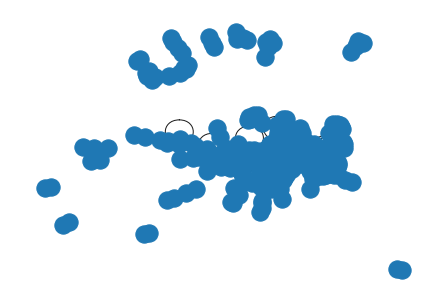

In [28]:
import networkx as nx
nx.draw(nxgraph)

---

# <a style="border: solid; padding:5pt; color:black; background-color:#909090">Appendix - Other visualization</a>

---

DF.mp_plot.matrix

In [115]:
procs_df.mp_plot.matrix(
    x="CreatedProcessParentName",
    y="CreatedProcessName",
    height=1600,
)

Loading BokehJS ...

Figure(id='19535', ...)

## Plot inverse - fewer interactions == larger circle

In [123]:
procs_df.mp_plot.matrix(
    x="CreatedProcessParentName",
    y="CreatedProcessName",
    height=1600,
    invert=True
)

Loading BokehJS ...

Figure(id='20351', ...)

In [132]:
procs_df[~procs_df["CreatedProcessAccountName"].isin(["LOCAL SERVICE", "SYSTEM", "NETWORK SERVICE"])].mp_plot.matrix(
    x="CreatedProcessAccountName",
    y="CreatedProcessName",
    height=800,
    invert=True,
    title="Processes executed by user (rarity)"
)

Loading BokehJS ...

Figure(id='21269', ...)